# Egypt Housing Price Analysis

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

### Load The Data

* Load data 
* Drop ID column
* Check Duplicates 
* Check Missing values

In [2]:
df=pd.read_csv('Egypt_Housing_Price.csv')
df.sample(3)

,ad_id,type,price,area,bedrooms,bathrooms,level,furnished,rent,city,region
6557,Ad id 177890833,apartment,2950000.0,200.0,4,3,ground,no,no,cairo,new cairo - el tagamoa
33957,Ad id 194282155,apartment,3800.0,200.0,3,2,1,NaN,yes,giza,hadayek al-ahram
42128,Ad id 194277250,apartment,1072000.0,134.0,2,2,ground,no,no,cairo,new capital city


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54329 entries, 0 to 54328
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ad_id      54329 non-null  object 
 1   type       54329 non-null  object 
 2   price      54329 non-null  float64
 3   area       54329 non-null  float64
 4   bedrooms   54329 non-null  object 
 5   bathrooms  54329 non-null  object 
 6   level      54329 non-null  object 
 7   furnished  42448 non-null  object 
 8   rent       54329 non-null  object 
 9   city       54329 non-null  object 
 10  region     54329 non-null  object 
dtypes: float64(2), object(9)
memory usage: 4.6+ MB


In [4]:
## Check duplicates

df.duplicated().sum()

32802

In [5]:
## Remove duplicated data

df.drop_duplicates(inplace=True)

In [6]:
## Drop ID Column

df.drop(['ad_id'],axis=1,inplace=True)

In [7]:
#Check missing values 

df.isnull().mean()*100

type          0.000000
price         0.000000
area          0.000000
bedrooms      0.000000
bathrooms     0.000000
level         0.000000
furnished    21.428903
rent          0.000000
city          0.000000
region        0.000000
dtype: float64

In [8]:
#Drop missing values

df.dropna(inplace=True)


In [9]:
#Check missing values after being handled

df.isnull().sum()

type         0
price        0
area         0
bedrooms     0
bathrooms    0
level        0
furnished    0
rent         0
city         0
region       0
dtype: int64

## Univariate Analysis

* Describe the Variables
* Cleaning and cleansing some needed variables 
* change datatypes from object to int 
* Check Datatypes after casting 
* Graph variables
* Check Outliers

In [10]:
cat_cols=df.select_dtypes('object').columns
num_cols=df.select_dtypes('number').columns

In [11]:
cat_cols

Index(['type', 'bedrooms', 'bathrooms', 'level', 'furnished', 'rent', 'city',
       'region'],
      dtype='object')

In [12]:
for cat in cat_cols:
    print(f'{cat}:')
    print('value_counts:',df[cat].value_counts())
    print('unique:',df[cat].unique())
    print('num of uniquness:',df[cat].nunique())
    print('**'*10)

type:
value_counts: apartment    15127
duplex         954
studio         445
penthouse      333
room            55
Name: type, dtype: int64
unique: ['apartment' 'duplex' 'penthouse' 'studio' 'room']
num of uniquness: 5
********************
bedrooms:
value_counts: 3      9781
2      4865
4      1273
1       707
5       179
6        70
8        12
7        11
10+       6
9         5
10        5
Name: bedrooms, dtype: int64
unique: ['3' '4' '2' '1' '5' '10+' '10' '6' '9' '7' '8']
num of uniquness: 11
********************
bathrooms:
value_counts: 2      6892
3      4684
1      4669
4       577
5        76
6        12
7         2
9         1
10+       1
Name: bathrooms, dtype: int64
unique: ['3' '4' '1' '2' '5' '9' '6' '10+' '7']
num of uniquness: 9
********************
level:
value_counts: 2          3666
ground     2961
3          2816
1          2646
4          1599
5          1049
6           478
10+         420
7           353
8           272
10          265
9           254
highest    

In [13]:
num_cols

Index(['price', 'area'], dtype='object')

In [14]:
for num in num_cols:
    print(num,':')
    print(df[num].describe())
    print('**'*10)

price :
count    1.691400e+04
mean     1.135266e+06
std      1.828918e+06
min      2.000000e+02
25%      9.000000e+03
50%      6.450000e+04
75%      1.850000e+06
max      5.000000e+07
Name: price, dtype: float64
********************
area :
count    16914.000000
mean       162.953774
std         71.444427
min          1.000000
25%        120.000000
50%        150.000000
75%        200.000000
max        975.000000
Name: area, dtype: float64
********************


In [15]:
## Cleaning and Cleansing 

In [16]:
df['bathrooms'].unique()

array(['3', '4', '1', '2', '5', '9', '6', '10+', '7'], dtype=object)

In [17]:
i=df[df['bathrooms']=='10+'].index

In [18]:
df.drop(i,axis=0,inplace=True)

In [47]:
df['bedrooms'].unique()

array(['3', '4', '2', '1', '5', '10', '6', '9', '7', '8'], dtype=object)

In [48]:
i=df[df['bedrooms']=='10+'].index

In [49]:
df.drop(i,axis=0,inplace=True)

In [67]:
df['city'].unique()

array(['cairo', 'sharqia', 'giza', 'alexandria', 'red sea', 'qalyubia',
       'damietta', 'ismailia', 'gharbia', 'port said', 'dakahlia',
       'asyut', 'minya', 'v', 'matruh', 'aswan', 'south sinai',
       'beni suef', 'qena', 'beheira', 'monufia', 'suez', 'new valley',
       'fayoum', 'kafr al-sheikh', 'luxor'], dtype=object)

In [68]:
x=df[df['city']=='v'].index

In [70]:
df.drop(x,axis=0,inplace=True)

In [ ]:
## Change datatype to int 

In [51]:
df['bathrooms']=df['bathrooms'].astype(int)

In [52]:
df['bedrooms']=df['bedrooms'].astype(int)

In [54]:
## Transform categorical values to numeric in LEVEL variable

In [57]:
mapping= {'ground':0,
          '1':1,
          '2':2,
          '3':3,
          '4':4,
          '5':5,
          '6':6,
          '7':7,
          '8':8,
          '9':9,
          '10':10,
          '10+':11,
          'highest':12}
df['level']=df['level'].map(mapping)

In [61]:
df['level']=df['level'].astype(int)

In [ ]:
## lets check the datatypes after casting 

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16885 entries, 1 to 54328
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   type       16885 non-null  object 
 1   price      16885 non-null  float64
 2   area       16885 non-null  float64
 3   bedrooms   16885 non-null  int32  
 4   bathrooms  16885 non-null  int32  
 5   level      16885 non-null  int32  
 6   furnished  16885 non-null  object 
 7   rent       16885 non-null  object 
 8   city       16885 non-null  object 
 9   region     16885 non-null  object 
dtypes: float64(2), int32(3), object(5)
memory usage: 1.2+ MB


In [88]:
cat_columns=df.select_dtypes('object').columns
cat_columns

Index(['type', 'furnished', 'rent', 'city', 'region'], dtype='object')

In [89]:
num_columns=df.select_dtypes('number').columns
num_columns

Index(['price', 'area', 'bedrooms', 'bathrooms', 'level'], dtype='object')

In [ ]:
## analysis using graphs 

In [185]:
for cat in cat_columns:
    plt=px.histogram(df[cat],title=f'Histogram for {cat}')
    plt.show()

In [184]:
for num in num_columns:
    plt=px.histogram(df[num],title=f'Histogram for {num}')
    plt.show()

In [ ]:
## Check Outliers

In [183]:
for num in num_columns:
    plt=px.box(df[num],title=f'Boxplot for {num}')
    plt.show()

### NOTES ON OUTLIERS:

* Price Boxplot shows that there are outliers between 4.6M to 50M, these are outliers as there are not included in the box of other observation
* Area Boxplot shows that there are outliers between 320 to 975, these are outliers as there are not included in the box of other observation
* Bedrooms Boxplot shows that there are outliers between 4 to 10, these are outliers as there are not included in the box of other observation
* Bathrooms Boxplot shows two points between 6 to 9, these are outliers as there are not included in the box of other observation
* level Boxplot shows four points between 8 to 12, these are outliers as there are not included in the box of other observation

## Multivariate Analysis

In [ ]:
## Plot Heatmap for numerical variables

In [179]:
px.imshow(df.corr(), x= num_columns,text_auto=True,title='Heatmap for numerical variables')

In [ ]:
## Scatter plot for variables

In [178]:
px.data.iris()
fig = px.scatter_matrix(df,
    dimensions=['price','bathrooms', 'bedrooms', 'area','level'],
    color='price',title='Scatter matrix for numerical variables')
fig.show()

In [ ]:
## plot some count plots for categorical variables

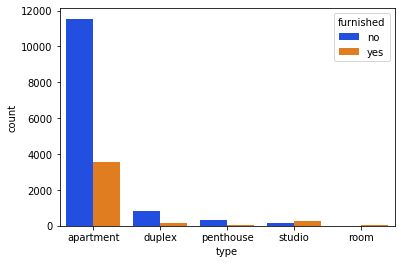

In [151]:
sns.countplot(data=df, x='type', hue='furnished', palette='bright');


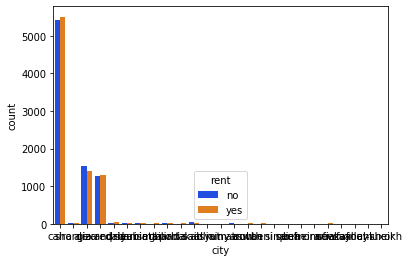

In [152]:
sns.countplot(data=df, x='city', hue='rent', palette='bright');

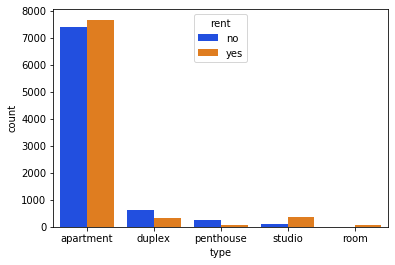

In [158]:
sns.countplot(data=df, x='type', hue='rent', palette='bright');

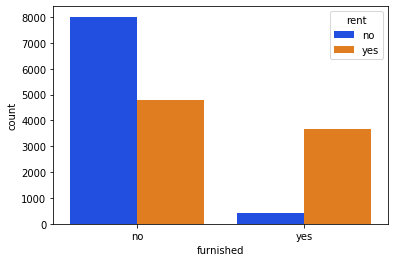

In [159]:
sns.countplot(data=df, x='furnished', hue='rent', palette='bright');

#### Q1-<font color='red'>Which region has the highest median price for furnished type?

</font>

In [194]:
median_furnished_price = df[df['furnished'] == 'yes'].groupby('region')['price'].median().sort_values(ascending=False)


In [329]:
px.bar(median_furnished_price, x=median_furnished_price.index, y='price', title='Region with Highest Median Price for furnished type')


#### Q2-<font color='red'> Which city has the largest average area for type?
</font>

In [200]:
avg_area_by_city = df.groupby('city')['area'].mean().sort_values(ascending=False)

In [330]:
px.bar(avg_area_by_city, x=avg_area_by_city.index, y='area', title='City with Largest Average Area for Type')

#### Q-3 <font color='red'>Show the top 10 region have largest area?

</font>

In [342]:
top_10_region_area=df.groupby('region')['area'].max().sort_values(ascending=False).head(10)

In [343]:
px.bar(top_10_region_area, x=top_10_region_area.index, y=top_10_region_area.values, title='Top 10 Regions with the Largest Area')

#### Q-4 <font color='red'>How many bathrooms in each type for each region?

</font>

In [338]:
bathroom_count = df.groupby(['region', 'type', 'bathrooms'])['bathrooms'].count().reset_index(name='Count')

In [339]:
px.treemap(bathroom_count, path=['region', 'type', 'bathrooms'], values='Count', title='Bathroom Count by Type and Region')

#### Q-5 <font color='red'>What is the average price for furnished type?

</font>

In [289]:
furnished_avg_price = df[df['furnished']=='yes'][['price']].mean().sort_values(ascending= False)
furnished_avg_price

price    276177.271857
dtype: float64

#### Q-5 <font color='red'>What is the max number of bedrooms for each type ?

</font>

In [263]:
max_bedrooms=df.groupby('type')['bedrooms'].max().sort_values(ascending= False)

In [358]:
px.histogram(max_bedrooms,x=max_bedrooms.index,y='bedrooms', title='Max num of bedrooms for each type')

#### Q-6 <font color='red'>What is the max number of bathrooms for each type ?

</font>

In [272]:
max_bathrooms=df.groupby('type')['bathrooms'].max().sort_values(ascending= False)


In [360]:
px.histogram(max_bathrooms,x=max_bathrooms.index,y='bathrooms', title='Max num of bathrooms for each type')


#### Q-7 <font color='red'>Which 3 types have highest prices?

</font>

In [355]:
top_types=df.groupby('type')['price'].max().sort_values(ascending=False).head(3)

In [357]:
px.histogram(top_types,x=top_types.index,y='price',title="Top 3 types which have highest prices ")

#### Q-8 <font color='red'>What is the max number of levels for each type ?

</font>

In [280]:
max_level=df.groupby('type')['level'].max().sort_values(ascending= False)

In [359]:
px.histogram(max_level,x=max_level.index,y='level', title='Max num of level for each type')


#### Q9-<font color='red'>Which level has the highest price?

</font>

In [361]:
df.groupby('level')['price'].max().sort_values(ascending=False).head(1)

level
11    50000000.0
Name: price, dtype: float64

# <font color='black'>Analysis  Done!